In [2]:
import kaleido
import plotly.express as px
import os
import numpy as np
import tensorflow as tf
from sklearn import metrics
import matplotlib as mpl
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from interpret import perf
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
import matplotlib.ticker as mticker
set_visualize_provider(InlineProvider())
import matplotlib.pyplot as plt
import shap
import pandas as pd
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
import tqdm as notebook_tqdm

In [3]:
data = pd.read_csv("GW_v3.csv") 
data.drop(["system:index", ".geo"], axis=1, inplace=True)

In [4]:
x = data.drop(["presence"],axis=1)
y = data["presence"]
train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.2, random_state=0)

In [5]:
data

,Aspect,Eastness,Elevation,GaussianCurvature,HAND,Hillshade,HorizontalCurvature,MaximalCurvature,MeanCurvature,MinimalCurvature,Northness,PRCPTOT,ShapeIndex,Slope,TPI,VerticalCurvature,lineament,presence
0,127.497713,0.793378,1494.704575,-9.869021e-07,613.43445,0.759099,-0.000607,0.000634,-0.000462,-0.001557,-0.608730,1258.3375,-0.268382,40.679466,127,-0.000316,0.541201,1
1,39.131004,0.631096,1122.837176,3.817523e-08,335.23517,0.830249,-0.000983,-0.000038,-0.000524,-0.001010,0.775705,1258.3375,-0.686094,34.047426,-1,-0.000065,0.832848,1
2,15.686834,0.270379,2036.524648,-5.590145e-07,114.29387,0.828289,-0.000504,0.000722,-0.000026,-0.000775,0.962754,1258.3375,-0.022437,34.210240,-60,0.000452,0.749804,1
3,208.080706,-0.470715,2106.038249,-2.512453e-06,466.65690,0.739287,0.000371,0.002123,0.000470,-0.001183,-0.882285,1251.1565,0.181022,42.172060,58,0.000569,0.792028,1
4,221.743194,-0.665793,1463.392820,2.710645e-06,94.56001,0.895170,0.002645,0.003822,0.002266,0.000709,-0.746136,1258.3375,0.926703,26.295283,-131,0.001886,1.101466,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5403,5.768753,0.100514,1124.548379,1.658860e-07,256.45870,0.917266,0.000581,0.000513,0.000418,0.000323,0.994936,1353.4120,2.808188,23.580560,61,0.000255,0.918776,1
5404,165.344505,0.253007,2148.813331,-1.079904e-06,193.93234,0.586958,0.000355,0.000947,-0.000097,-0.001140,-0.967465,1251.1565,-0.058953,54.005111,-134,-0.000548,1.142460,1
5405,208.992774,-0.484699,1285.240106,-4.683780e-06,262.29830,0.972737,0.004885,0.005548,0.002352,-0.000844,-0.874681,1353.4120,0.468485,13.250726,62,-0.000181,0.879827,1
5406,229.911521,-0.765051,1558.755453,-1.453858e-06,294.50116,0.930105,-0.001374,0.000995,-0.000233,-0.001461,-0.643970,1353.4120,-0.120869,21.368916,77,0.000908,0.976497,1


# EBM

In [6]:
ebm = ExplainableBoostingClassifier(random_state = 1, interactions = 0)
ebm.fit(train_x, train_y)

ExplainableBoostingClassifier(interactions=0, random_state=1)

In [7]:
#using prediction probability instead of absolute value for better ROC 
roc = perf.ROC(ebm.predict_proba, feature_names=train_x.columns)
roc_explanation = roc.explain_perf(test_x, test_y)
show(roc_explanation)

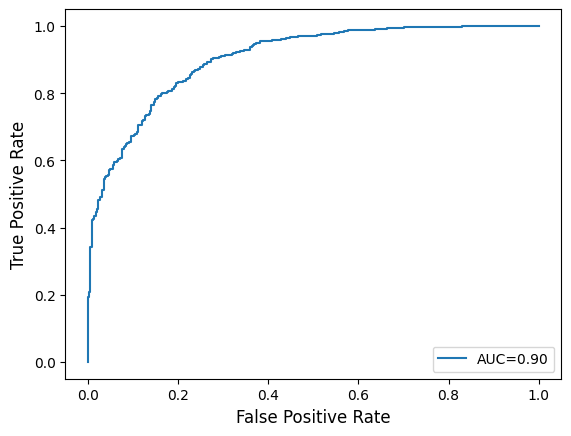

In [8]:
#define metrics
y_pred_proba = ebm.predict_proba(test_x)[:,1]
fpr, tpr, _ = metrics.roc_curve(test_y,  y_pred_proba)
auc = metrics.roc_auc_score(test_y, y_pred_proba)

#create ROC curve
plt.plot(fpr, tpr, label="AUC={:.2f}".format(auc))

plt.xlabel('False Positive Rate', size=12)
plt.xticks(size=10)

plt.ylabel('True Positive Rate', size=12)
plt.yticks(size=10)

plt.legend(loc=4)
plt.show()


In [9]:
ebm.predict_proba(test_x)[:,1]

array([0.85361643, 0.79683905, 0.64361006, ..., 0.97576659, 0.82116488,
       0.72448301])

# Model-Agnostic Explainer for EBM

### SHAP for Global Behaviour

In [10]:
masker = shap.maskers.Independent(data = test_x)
explainer = shap.Explainer(ebm, masker = masker)
shap_values = explainer(test_x)

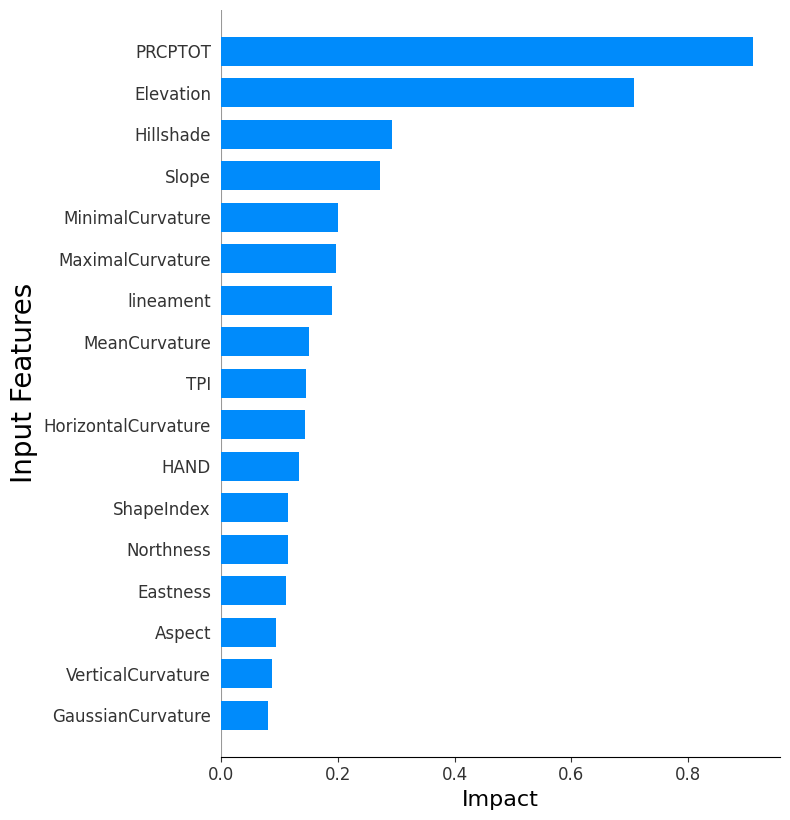

In [11]:
shap.summary_plot(shap_values, test_x, plot_type="bar", show=False)
plt.xlabel('Impact', fontsize=16)
plt.ylabel('Input Features', fontsize=20)
plt.yticks(size=12)
plt.xticks(size=12)
plt.tight_layout()


C:\Users\kdahal3.ASURITE\.conda\envs\SLR\lib\site-packages\shap\plots\_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



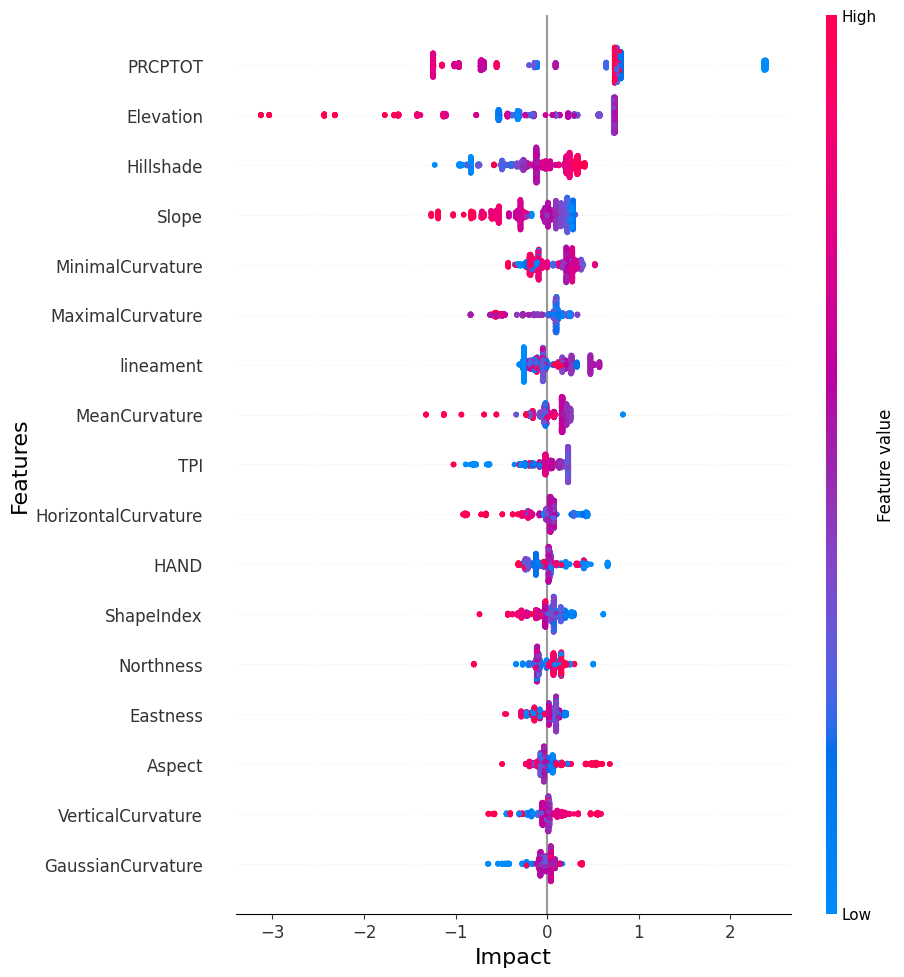

In [12]:
shap.summary_plot(shap_values, test_x, show=False)
fig = plt.gcf()
fig.set_figheight(10)
fig.set_figwidth(10)
ax = plt.gca()
ax.set_xlabel('Impact', fontsize=16)
ax.set_ylabel('Features', fontsize=16)
ax.tick_params(labelsize=12)
# plt.savefig('beeswarm_plot.png', dpi=300, bbox_inches='tight')


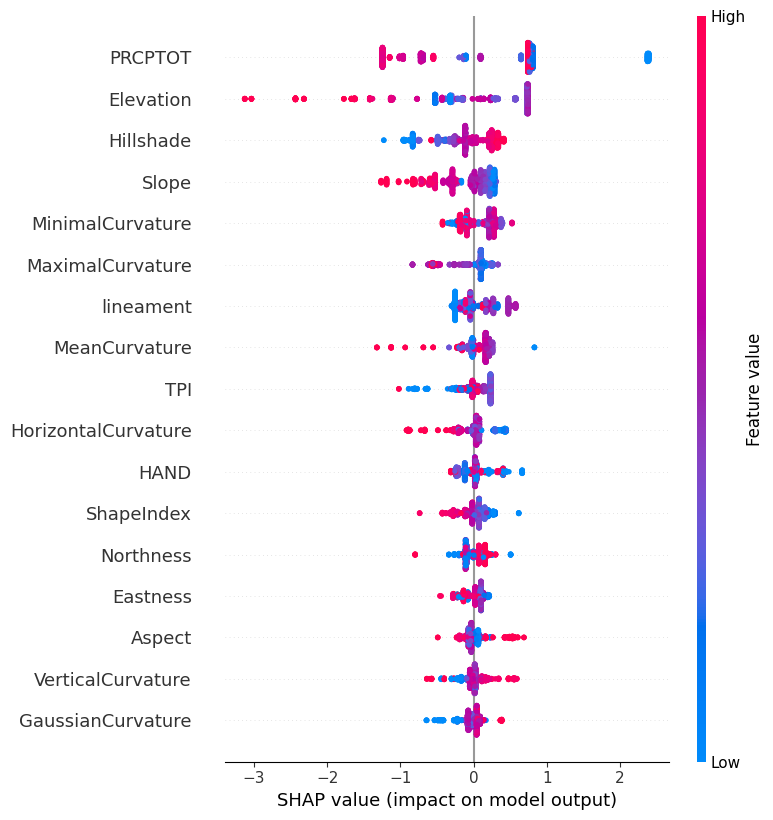

In [13]:
shap.summary_plot(shap_values, test_x, show=False)

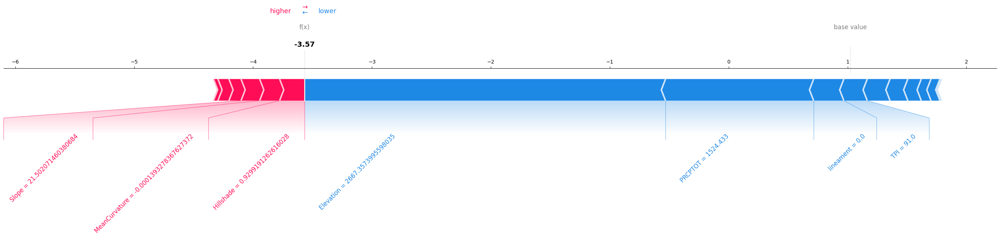

In [14]:
shap.force_plot(shap_values[663], matplotlib=True, figsize=(35,5),text_rotation=45)

In [15]:
shap_values

.values =
array([[-0.04043389, -0.00654387,  0.74139592, ..., -0.81961688,
        -0.1061092 , -0.1946733 ],
       [ 0.00349707,  0.18990075,  0.29605308, ..., -0.05575581,
         0.01965871,  0.47368773],
       [-0.07166461, -0.13859437,  0.73575183, ...,  0.23186878,
         0.01609078,  0.16615601],
       ...,
       [ 0.03877889, -0.07813397,  0.74139592, ...,  0.03701348,
         0.01501211,  0.2692556 ],
       [ 0.05870253,  0.03750178,  0.56074324, ...,  0.13246363,
         0.05758672, -0.10110072],
       [ 0.05870253,  0.03750178,  0.33194837, ..., -0.02996972,
        -0.04790723, -0.11729867]])

.base_values =
array([1.02228362, 1.02228362, 1.02228362, ..., 1.02228362, 1.02228362,
       1.02228362])

.data =
array([[ 1.39092097e+02,  6.54845061e-01,  1.45262020e+03, ...,
        -1.18000000e+02, -3.23191870e-03,  1.11299370e+00],
       [ 3.07900336e+02, -7.89080483e-01,  1.08246325e+03, ...,
        -7.40000000e+01, -1.80203828e-03,  9.04042600e-01],
       [ 1.1

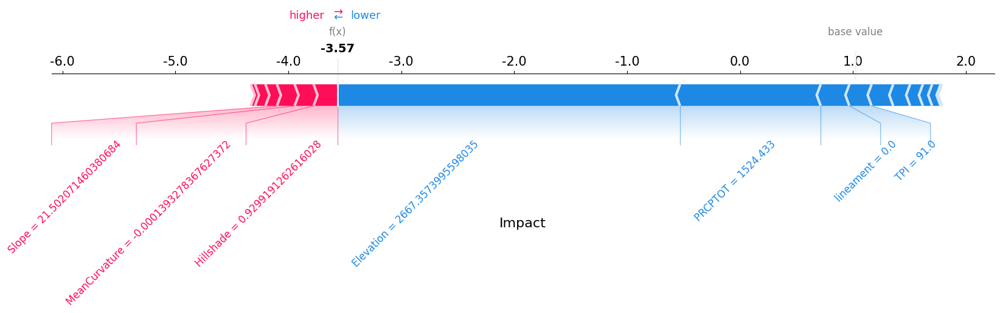

In [16]:
# visualize the first prediction's explanation
i = 0
shap.force_plot(shap_values[663], matplotlib=True, figsize=(35,5),show=False,text_rotation=45)
fig = plt.gcf()
fig.set_figheight(3)
fig.set_figwidth(20)
label_format = '{:,.1f}'
ax = plt.gca()
ax.set_xlabel(r'Impact', fontsize=16)
# ax.set_ylabel('Input Features', fontsize=20)
ylabels = [tick.get_text() for tick in ax.get_yticklabels()]
ax.set_yticklabels(ylabels, size= 14)
ticks_loc = ax.get_xticks().tolist()
ax.xaxis.set_major_locator(mticker.FixedLocator(ticks_loc))
ax.set_xticklabels([label_format.format(x) for x in ticks_loc], size=15)
plt.show()
# plt.savefig("Waterfall_.png", dpi=600, bbox_inches='tight')

In [16]:
# shap.decision_plot(explainer.base_value, shap_values)

In [17]:
shap.initjs()
shap.force_plot(shap_values, test_x)

In [18]:
shap.plots.scatter(shap_values, color=shap_values, show=False)
f = plt.gcf().set_size_inches(45,6)

# Model specific for EBM

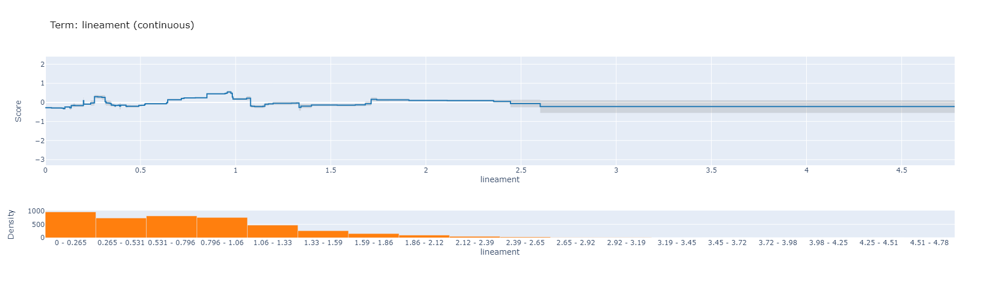

In [17]:
from plotly.subplots import make_subplots

ebm_global = ebm.explain_global()
fig = make_subplots(rows=4, cols=4)
for key, ind in enumerate(range(len(ebm_global.selector))):
    fig = ebm_global.visualize(key)
    fig.update_layout(
        # font=dict(family="DejaVu Sans"),
        title_font_color="Black",
        width=400,
        height=500,
    )
    fig.write_image(f".\EBM_Graphs\Model_specific\pdp{ind}.pdf")
fig.show()

In [26]:
ebm_global = ebm.explain_global()

In [18]:
ebm_global = ebm.explain_global()
show(ebm_global)


In [ ]:
# ebm_global = ebm.explain_global()

# fig = make_subplots(rows=1, cols=2)
# # for key, ind in enumerate(range(len(ebm_global.selector))):
# fig.add_trace(ebm_global.visualize(), row=1, col=1)
# fig.add_trace(ebm_global.visualize(2), row=1, col=2)

In [46]:
import rasterio
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the raster dataset stack using rasterio
with rasterio.open('pred/parameters_100.tif') as src:
    stack = src.read()

# Reshape the stack to a 2D array (n_samples, n_features)
stack_2d = stack.reshape(stack.shape[0], -1).T

# Convert the 2D array to a pandas DataFrame
df = pd.DataFrame(data=stack_2d)

# Normalize the features using the same scaler that was used to train the EBM model
scaler = StandardScaler()
X = scaler.fit_transform(df)

# Use the EBM model to predict the probabilities for each pixel in the raster stack
y_pred_proba = ebm.predict_proba(X)[:, 1]

# Reshape the probabilities to match the original raster shape
y_pred_proba = y_pred_proba.reshape(stack.shape[1], stack.shape[2])

# Save the predicted probabilities as a new raster using rasterio
with rasterio.open('pred/predicted_ebm1.tiff', 'w', **src.meta) as dst:
    dst.write(y_pred_proba, 1)


In [47]:
y_pred_proba

array([[0.74520672, 0.74520672, 0.74520672, ..., 0.43639726, 0.29967538,
        0.33224289],
       [0.74520672, 0.74520672, 0.74520672, ..., 0.05171648, 0.28688227,
        0.27469214],
       [0.74520672, 0.74520672, 0.74520672, ..., 0.25263617, 0.27054437,
        0.27233453],
       ...,
       [0.74520672, 0.74520672, 0.74520672, ..., 0.44177747, 0.41420771,
        0.41420771],
       [0.74520672, 0.74520672, 0.74520672, ..., 0.3112682 , 0.41420771,
        0.41420771],
       [0.74520672, 0.74520672, 0.74520672, ..., 0.05907051, 0.21537921,
        0.41420771]])

In [26]:
y_pred_proba

array([[0.74520672, 0.74520672, 0.74520672, ..., 0.74520672, 0.74520672,
        0.74520672],
       [0.74520672, 0.74520672, 0.74520672, ..., 0.43340213, 0.43329295,
        0.81703069],
       [0.85715018, 0.40597185, 0.40597185, ..., 0.74520672, 0.74520672,
        0.74520672],
       ...,
       [0.65200547, 0.65200547, 0.50236205, ..., 0.08021441, 0.03326391,
        0.03326391],
       [0.03326391, 0.05135702, 0.36098954, ..., 0.08579621, 0.08579621,
        0.08579621],
       [0.07268315, 0.13467364, 0.0498196 , ..., 0.05907051, 0.21537921,
        0.41420771]])

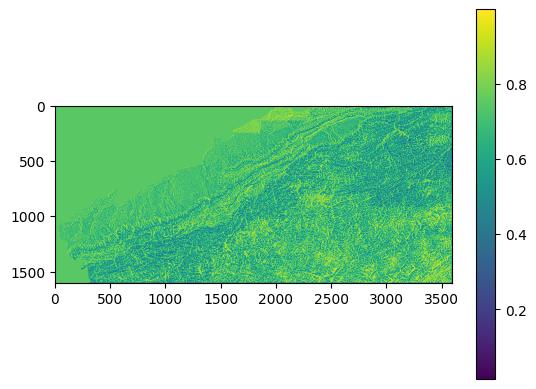

In [43]:
import matplotlib.pyplot as plt
plt.imshow(y_pred_proba)
plt.colorbar()
plt.show()


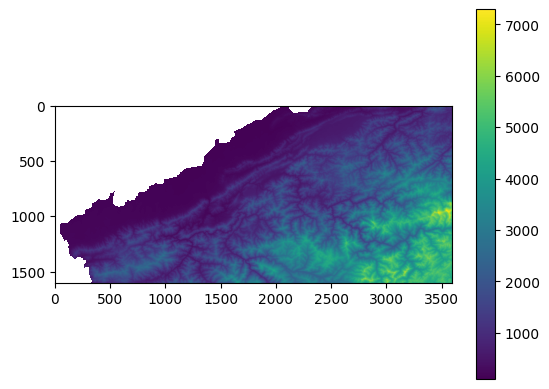

In [40]:
import matplotlib.pyplot as plt
plt.imshow(stack[0])
plt.colorbar()
plt.show()
